**Lectura inicial de los datos**

In [1]:
import pandas as pd

In [2]:
x_train = pd.read_csv('x_train.csv')

In [3]:
pd.set_option('display.max_columns', None)
x_train.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


Con el .info vemos una primera aproximación a los datos. Tenemos algunas variables con nulos y observamos los distintos tipos de variables 

In [4]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55763 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59398 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

In [5]:
y_train = pd.read_csv('y_train.csv')

In [6]:
y_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            59400 non-null  int64 
 1   status_group  59400 non-null  object
dtypes: int64(1), object(1)
memory usage: 928.3+ KB


In [7]:
x_test = pd.read_csv('x_test.csv')

In [8]:
x_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     14850 non-null  int64  
 1   amount_tsh             14850 non-null  float64
 2   date_recorded          14850 non-null  object 
 3   funder                 13980 non-null  object 
 4   gps_height             14850 non-null  int64  
 5   installer              13973 non-null  object 
 6   longitude              14850 non-null  float64
 7   latitude               14850 non-null  float64
 8   wpt_name               14850 non-null  object 
 9   num_private            14850 non-null  int64  
 10  basin                  14850 non-null  object 
 11  subvillage             14751 non-null  object 
 12  region                 14850 non-null  object 
 13  region_code            14850 non-null  int64  
 14  district_code          14850 non-null  int64  
 15  lg

Juntos x_test con la objetivo para poder entrenar más adelante

In [9]:
df_train = pd.merge(x_train, y_train, on='id', how='inner')

In [10]:
df_train.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


In [11]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55763 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59398 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

Descripción de las variables numéricas, se ven distribuciones alejadas de una normal como amount_tsh o gps_height, con diferencias entre sus medias y mediana (valores atípicos altos pinta) y otras cosas raras como que el año minimo de construcción sea cero.

In [12]:
df_train.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


Hay variables categóricas con una cardinalidad muy alta por lo que habrá que ver como tratar

In [13]:
for i in df_train.select_dtypes(include=['object', 'category']).columns:
    print(f"\n🔹 Columna: {i}")
    print(df_train[i].value_counts())
    print(f"Total únicos: {df_train[i].nunique()}")




🔹 Columna: date_recorded
date_recorded
2011-03-15    572
2011-03-17    558
2013-02-03    546
2011-03-14    520
2011-03-16    513
             ... 
2011-09-11      1
2011-08-31      1
2011-09-21      1
2011-08-30      1
2013-12-01      1
Name: count, Length: 356, dtype: int64
Total únicos: 356

🔹 Columna: funder
funder
Government Of Tanzania    9084
Danida                    3114
Hesawa                    2202
Rwssp                     1374
World Bank                1349
                          ... 
Muwasa                       1
Msigw                        1
Rc Mofu                      1
Overland High School         1
Samlo                        1
Name: count, Length: 1896, dtype: int64
Total únicos: 1896

🔹 Columna: installer
installer
DWE                17402
Government          1825
RWE                 1206
Commu               1060
DANIDA              1050
                   ...  
Wizara  ya maji        1
TWESS                  1
Nasan workers          1
R                     

In [14]:
df_train.shape

(59400, 41)

In [15]:
df_train.isnull().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    3637
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     2
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3878
scheme_name              28810
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [16]:
df_train.columns

Index(['id', 'amount_tsh', 'date_recorded', 'funder', 'gps_height',
       'installer', 'longitude', 'latitude', 'wpt_name', 'num_private',
       'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga',
       'ward', 'population', 'public_meeting', 'recorded_by',
       'scheme_management', 'scheme_name', 'permit', 'construction_year',
       'extraction_type', 'extraction_type_group', 'extraction_type_class',
       'management', 'management_group', 'payment', 'payment_type',
       'water_quality', 'quality_group', 'quantity', 'quantity_group',
       'source', 'source_type', 'source_class', 'waterpoint_type',
       'waterpoint_type_group', 'status_group'],
      dtype='object')

Mapeamos la variable target

In [17]:
mapeo_status = {
    'functional': 2,
    'non functional': 0,
    'functional needs repair': 1
}

df_train['status_group'] = df_train['status_group'].map(mapeo_status)

Comprobamos correlación de las variables numéricas con la target y también de las categóricas. Vemos como algunas si parecen estar relacionadas como gps_height, region_code... otras como num_private o longitude apenas. Las categóricas al ser el ANOVA el p-valor<0 parecen ser significativas para explicar la y.

In [18]:
# Solo numéricas
num_cols = df_train.select_dtypes(include=['float64', 'int64']).columns
corr = df_train[num_cols].corr()['status_group'].sort_values(key=abs, ascending=False)

print(corr)

status_group         1.000000
gps_height           0.114029
region_code         -0.108640
district_code       -0.065687
amount_tsh           0.053702
construction_year    0.043342
population           0.017759
latitude             0.014547
num_private          0.005021
longitude           -0.004366
id                  -0.004049
Name: status_group, dtype: float64


In [19]:
from scipy.stats import f_oneway

y = df_train['status_group']

# Columnas categóricas con <= 20 categorías únicas
cat_cols = [col for col in df_train.select_dtypes(include='object').columns
            if df_train[col].nunique() <= 20]

anova_results = {}

for col in cat_cols:
    groups = [y[df_train[col] == cat] for cat in df_train[col].dropna().unique()]
    if all(len(group) > 1 for group in groups):
        try:
            f_stat, p_val = f_oneway(*groups)
            anova_results[col] = p_val
        except:
            continue  # En caso de error numérico

# Mostrar ordenado por p-value
sorted_anova = sorted(anova_results.items(), key=lambda x: x[1])

for col, p in sorted_anova:
    print(f"{col:<30} p-value: {p:.4e}")




extraction_type                p-value: 0.0000e+00
extraction_type_group          p-value: 0.0000e+00
extraction_type_class          p-value: 0.0000e+00
management                     p-value: 0.0000e+00
payment                        p-value: 0.0000e+00
payment_type                   p-value: 0.0000e+00
water_quality                  p-value: 0.0000e+00
quality_group                  p-value: 0.0000e+00
quantity                       p-value: 0.0000e+00
quantity_group                 p-value: 0.0000e+00
source                         p-value: 0.0000e+00
waterpoint_type                p-value: 0.0000e+00
waterpoint_type_group          p-value: 0.0000e+00
basin                          p-value: 7.7146e-312
scheme_management              p-value: 2.2498e-246
source_type                    p-value: 1.0282e-243
public_meeting                 p-value: 5.4011e-66
management_group               p-value: 1.1687e-27
permit                         p-value: 2.1816e-15
source_class                

Con esta herramienta obtenemos valiosa información acerca de las variables: nulos, distribución, correlaciones, etc

In [20]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df_train, title="EDA Report", explorative=True)



In [21]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 41/41 [00:10<00:00,  3.88it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Tras este primer análisis, llega el momento de empezar a decidir que hacer con las variables. En primer lugar eliminaré aquellas que considero que no son relevantes para el análisis:
* Id : es tan solo un identificativo
* Date_recorded: tan solo es la fecha en la que se introdujo la fila en el dataset, tampoco es relevante.
* Latitude, longitude : variables de geolocalización, correladas con otras variables de localización que dejaré en el análisis y que aportan lo mismo.
* Wpt_name : es el nombre del waterpoint, no creo que sea relevante para la variable objetivo y tiene caridinalidad muy alta
* Num_private: no sabemos que es esta variable, casi todos sus valores son 0 (99%) y no estaba correlada con la y.
* Subvillage,lga, ward: son todas variables de localización, con cardinalidades muy alta. Es como un desglose de otras más básicas como region o district. Es repetir información, aportan lo mismo.
* Region: la quito porque ya hay otra variable igual pero codificada
* Recorded_by : tiene un solo valor constante
* Scheme_name : scheme_management recoge lo mismo con mucha menor cardinalidad
* Extraction_type_group, management, payment_type, water_quality, quantity_group, extraction_type, source, source_type, waterpoint_type: todas estas les pasa lo mismo, tienen otras variables que recogen la misma data pero agrupada, en menor cardinalidad. Sería duplicar información.

Cabe destacar que hay algunas variables que metí en algun modelo pero acabé quitando porque no tenían importancia y por estas razones.

In [43]:
cols_to_drop = ['id',
    'date_recorded', 'latitude', 'longitude', 'wpt_name','num_private', 'subvillage', 'region', 'lga', 'ward',
    'recorded_by', 'scheme_name', 'extraction_type', 'extraction_type_group',
    'management', 'payment_type', 'water_quality', 'quantity_group',
    'source', 'source_type', 'waterpoint_type'
]

df_train.drop(columns=cols_to_drop, inplace=True)


In [45]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             59400 non-null  float64
 1   funder                 55763 non-null  object 
 2   gps_height             59400 non-null  int64  
 3   installer              55745 non-null  object 
 4   basin                  59400 non-null  object 
 5   region_code            59400 non-null  int64  
 6   district_code          59400 non-null  int64  
 7   population             59400 non-null  int64  
 8   public_meeting         56066 non-null  object 
 9   scheme_management      55522 non-null  object 
 10  permit                 56344 non-null  object 
 11  construction_year      59400 non-null  int64  
 12  extraction_type_class  59400 non-null  object 
 13  management_group       59400 non-null  object 
 14  payment                59400 non-null  object 
 15  qu

Quitando estas variables hemos matado dos pájaros de un tiro, ya que además nos hemos librado de muchas con nulos. Ahora solo quedan 5 con nulos (aprox 5% cada una)
* Con funder e installer, eran variables con alta cardinalidad, pero tenían un valor en ellas que se repetía mucho (en funder Gobierno de Tanzania casi 10000 y en installer DWE 17000) por lo que a través de un simple imputer los sustituyo por la moda, que creo que es lo que más sentido tiene
* Con las otras 3, 2 de ellas booleans, he pensado que sería demasiado irreal tirar por la moda directamente, por lo que he visto con que otras variables tenían relación, y he imputado por la moda considerando cada grupo dentro de las variables con las que estaban correladas. De este modo, he rellenado scheme_management en base a la moda en cada grupo de management_group, lo mismo con public_meeting, y para permit con scheme_management

In [47]:
df_train.isnull().sum()

amount_tsh                  0
funder                   3637
gps_height                  0
installer                3655
basin                       0
region_code                 0
district_code               0
population                  0
public_meeting           3334
scheme_management        3878
permit                   3056
construction_year           0
extraction_type_class       0
management_group            0
payment                     0
quality_group               0
quantity                    0
source_class                0
waterpoint_type_group       0
status_group                0
dtype: int64

In [49]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='most_frequent')

cols = ['funder', 'installer' ]
df_train[cols] = imputer.fit_transform(df_train[cols])


In [55]:
df_train['scheme_management'] = df_train.groupby('management_group')['scheme_management'].transform(
    lambda x: x.fillna(x.mode()[0]) if not x.mode().empty else x
)
df_train['permit'] = df_train.groupby('scheme_management')['permit'].transform(
    lambda x: x.fillna(x.mode()[0]) if not x.mode().empty else x
)
df_train['public_meeting'] = df_train.groupby('management_group')['public_meeting'].transform(
    lambda x: x.fillna(x.mode()[0]) if not x.mode().empty else x
)


In [57]:
df_train.isnull().sum()

amount_tsh               0
funder                   0
gps_height               0
installer                0
basin                    0
region_code              0
district_code            0
population               0
public_meeting           0
scheme_management        0
permit                   0
construction_year        0
extraction_type_class    0
management_group         0
payment                  0
quality_group            0
quantity                 0
source_class             0
waterpoint_type_group    0
status_group             0
dtype: int64

In [59]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             59400 non-null  float64
 1   funder                 59400 non-null  object 
 2   gps_height             59400 non-null  int64  
 3   installer              59400 non-null  object 
 4   basin                  59400 non-null  object 
 5   region_code            59400 non-null  int64  
 6   district_code          59400 non-null  int64  
 7   population             59400 non-null  int64  
 8   public_meeting         59400 non-null  bool   
 9   scheme_management      59400 non-null  object 
 10  permit                 59400 non-null  bool   
 11  construction_year      59400 non-null  int64  
 12  extraction_type_class  59400 non-null  object 
 13  management_group       59400 non-null  object 
 14  payment                59400 non-null  object 
 15  qu

Limpios ya de nulos, paso a decidir que hacer con las variables categóricas. Hay 2 con alta cardinalidad, funder e installer, por lo que en estas lo que he decidido ha sido agrupación de valores raros. Me he quedado con el top 10 en cada una y el resto lo he metido a other. Luego los he convertido a su frecuencia relativa.
El resto de categóricas tienen mucha menor cardinalidad. Para estas variables, con unas 10 categorías distintas, he decidido hacer dummies, que con las otras era imposible, pero con estas sí tiene sentido.

In [61]:
for i in df_train.select_dtypes(include=['object', 'category']).columns:
    print(f"\n🔹 Columna: {i}")
    print(df_train[i].value_counts())
    print(f"Total únicos: {df_train[i].nunique()}")


🔹 Columna: funder
funder
Government Of Tanzania    12721
Danida                     3114
Hesawa                     2202
Rwssp                      1374
World Bank                 1349
                          ...  
Muwasa                        1
Msigw                         1
Rc Mofu                       1
Overland High School          1
Samlo                         1
Name: count, Length: 1896, dtype: int64
Total únicos: 1896

🔹 Columna: installer
installer
DWE                21057
Government          1825
RWE                 1206
Commu               1060
DANIDA              1050
                   ...  
Wizara  ya maji        1
TWESS                  1
Nasan workers          1
R                      1
SELEPTA                1
Name: count, Length: 2145, dtype: int64
Total únicos: 2145

🔹 Columna: basin
basin
Lake Victoria              10248
Pangani                     8940
Rufiji                      7976
Internal                    7785
Lake Tanganyika             6432
Wami / R

In [63]:
top_funders = df_train['funder'].value_counts().nlargest(10).index
df_train['funder'] = df_train['funder'].where(df_train['funder'].isin(top_funders), 'Other')

top_installers = df_train['installer'].value_counts().nlargest(10).index
df_train['installer'] = df_train['installer'].where(df_train['installer'].isin(top_installers), 'Other')


In [67]:
df_train['funder'] = df_train['funder'].map(df_train['funder'].value_counts(normalize=True))
df_train['installer'] = df_train['installer'].map(df_train['installer'].value_counts(normalize=True))



In [69]:
cols_to_encode = [
    'basin',
    'scheme_management',
    'extraction_type_class',
    'management_group',
    'payment',
    'quality_group',
    'quantity',
    'source_class',
    'waterpoint_type_group'
]

df_train = pd.get_dummies(df_train, columns=cols_to_encode, drop_first=False)


Transformo todas las booleans a 0/1

In [71]:
df_train = df_train.astype({col: int for col in df_train.select_dtypes(include='bool').columns})


In [73]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 70 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   amount_tsh                                59400 non-null  float64
 1   funder                                    59400 non-null  float64
 2   gps_height                                59400 non-null  int64  
 3   installer                                 59400 non-null  float64
 4   region_code                               59400 non-null  int64  
 5   district_code                             59400 non-null  int64  
 6   population                                59400 non-null  int64  
 7   public_meeting                            59400 non-null  int32  
 8   permit                                    59400 non-null  int32  
 9   construction_year                         59400 non-null  int64  
 10  status_group                      

In [75]:
df_train.head()

,amount_tsh,funder,gps_height,installer,region_code,district_code,population,public_meeting,permit,construction_year,status_group,basin_Internal,basin_Lake Nyasa,basin_Lake Rukwa,basin_Lake Tanganyika,basin_Lake Victoria,basin_Pangani,basin_Rufiji,basin_Ruvuma / Southern Coast,basin_Wami / Ruvu,scheme_management_Company,scheme_management_Other,scheme_management_Parastatal,scheme_management_Private operator,scheme_management_SWC,scheme_management_Trust,scheme_management_VWC,scheme_management_WUA,scheme_management_WUG,scheme_management_Water Board,scheme_management_Water authority,extraction_type_class_gravity,extraction_type_class_handpump,extraction_type_class_motorpump,extraction_type_class_other,extraction_type_class_rope pump,extraction_type_class_submersible,extraction_type_class_wind-powered,management_group_commercial,management_group_other,management_group_parastatal,management_group_unknown,management_group_user-group,payment_never pay,payment_other,payment_pay annually,payment_pay monthly,payment_pay per bucket,payment_pay when scheme fails,payment_unknown,quality_group_colored,quality_group_fluoride,quality_group_good,quality_group_milky,quality_group_salty,quality_group_unknown,quantity_dry,quantity_enough,quantity_insufficient,quantity_seasonal,quantity_unknown,source_class_groundwater,source_class_surface,source_class_unknown,waterpoint_type_group_cattle trough,waterpoint_type_group_communal standpipe,waterpoint_type_group_dam,waterpoint_type_group_hand pump,waterpoint_type_group_improved spring,waterpoint_type_group_other
0,6000.0,0.561111,1390,0.494242,11,5,109,1,0,1999,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0
1,0.0,0.561111,1399,0.494242,20,2,280,1,1,2010,2,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0
2,25.0,0.561111,686,0.494242,21,4,250,1,1,2009,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0
3,0.0,0.017795,263,0.494242,90,63,58,1,1,1986,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0
4,0.0,0.561111,0,0.494242,18,1,0,1,1,0,2,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0


En este paso trato las numéricas que quedan. En primer lugar la variable construction_year, que ya había visto antes que tenía muchos 0. Aquí voy a sustituir los 0 por la moda en cada grupo de gps_height, con la que está muy correlada y creo que puede ser realista rellenar los 0 con años de verdad, en base a otra variable con la que tiene relación. Una vez hecho eso, cambio el "significado" de la variable: A 2025 le resto el construction_year para quedarme con los "años desde construcción" lo cual reduce mucho la escala de la variable.

In [77]:
df_train['construction_year'].value_counts().sort_index()


construction_year
0       20709
1960      102
1961       21
1962       30
1963       85
1964       40
1965       19
1966       17
1967       88
1968       77
1969       59
1970      411
1971      145
1972      708
1973      184
1974      676
1975      437
1976      414
1977      202
1978     1037
1979      192
1980      811
1981      238
1982      744
1983      488
1984      779
1985      945
1986      434
1987      302
1988      521
1989      316
1990      954
1991      324
1992      640
1993      608
1994      738
1995     1014
1996      811
1997      644
1998      966
1999      979
2000     2091
2001      540
2002     1075
2003     1286
2004     1123
2005     1011
2006     1471
2007     1587
2008     2613
2009     2533
2010     2645
2011     1256
2012     1084
2013      176
Name: count, dtype: int64

In [81]:
df_train['construction_year'] = df_train.groupby('gps_height')['construction_year'].transform(
    lambda x: x.replace(0, x[x != 0].mode()[0]) if not x[x != 0].mode().empty else x
)


In [83]:
df_train['construction_year'] = 2025 - df_train['construction_year']


In [91]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 70 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   amount_tsh                                59400 non-null  float64
 1   funder                                    59400 non-null  float64
 2   gps_height                                59400 non-null  int64  
 3   installer                                 59400 non-null  float64
 4   region_code                               59400 non-null  int64  
 5   district_code                             59400 non-null  int64  
 6   population                                59400 non-null  int64  
 7   public_meeting                            59400 non-null  int32  
 8   permit                                    59400 non-null  int32  
 9   construction_year                         59400 non-null  int64  
 10  status_group                      

Identifcación de outliers en las variables numéricas, con el zscore veo que hay outliers sobre todo en population y amount_tsh, por la cola de la derecha. Para reducir el impacto de outliers aplico una winsorización por los extremos altos al percentil 99 que reduzca la escala de estas variables

amount_tsh: 237 outliers detectados


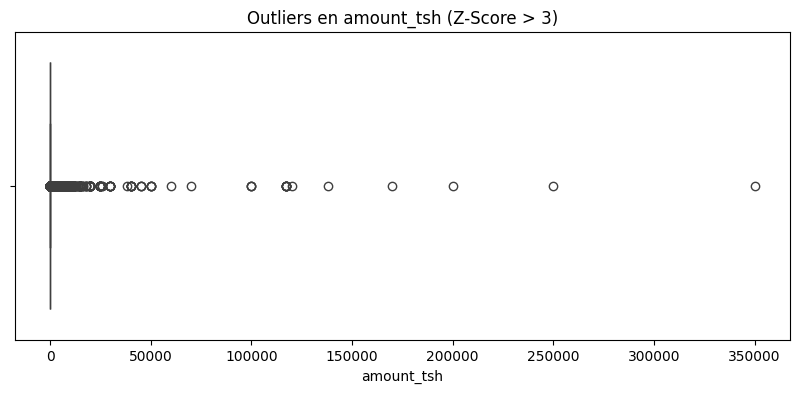

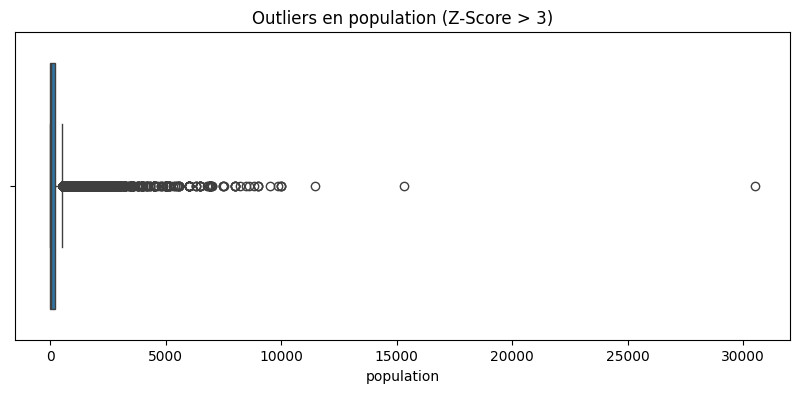

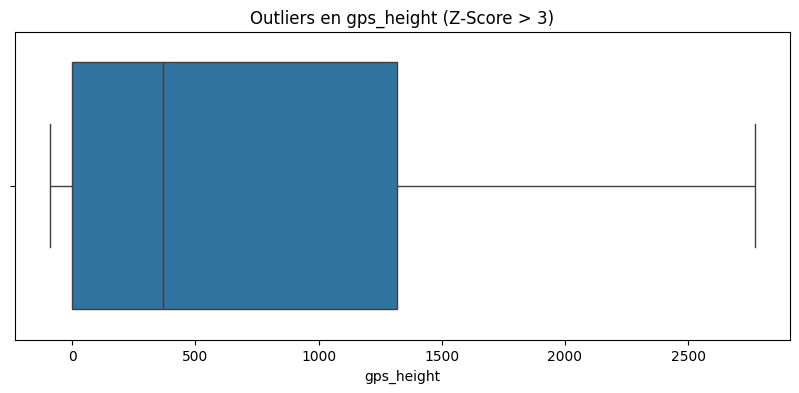

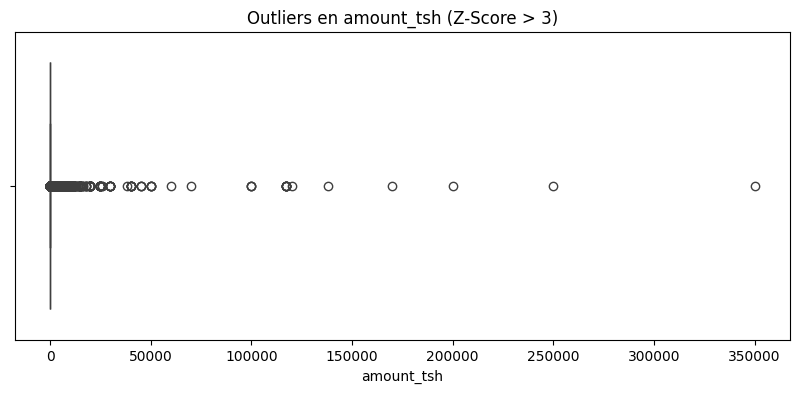

population: 729 outliers detectados


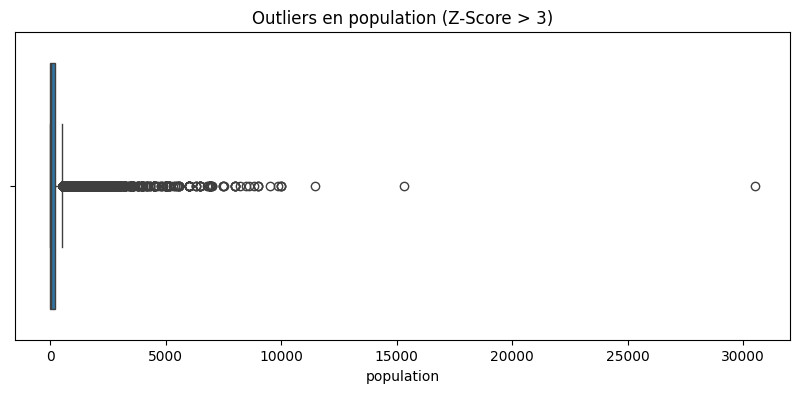

gps_height: 1 outliers detectados


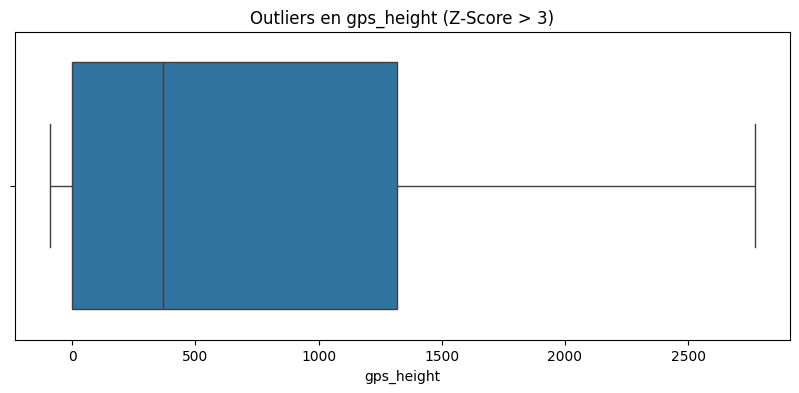

In [97]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
%matplotlib inline


# Selección de columnas numéricas que quieres analizar
cols_continuas = ['amount_tsh', 'population', 'gps_height']

# Calculamos los z-scores
z_scores = df_train[cols_continuas].apply(zscore)

# Creamos un DataFrame booleano con True donde hay outliers (z > 3 o z < -3)
outliers_mask = (np.abs(z_scores) > 3)

# Visualización de outliers para cada variable
for col in cols_continuas:
    plt.figure(figsize=(10, 4))
    sns.boxplot(data=df_train, x=col)
    plt.title(f'Outliers en {col} (Z-Score > 3)')
    
    # Contamos cuántos outliers hay
    outliers_count = outliers_mask[col].sum()
    print(f"{col}: {outliers_count} outliers detectados")
    
    plt.show()



In [101]:
from scipy.stats.mstats import winsorize

cols = ['amount_tsh', 'population', 'gps_height']

# Aplica winsorización para cada columna entre los percentiles 1% y 99%
for col in cols:
    lower = df_train[col].min()  # Dejas el mínimo como está (no cambias)
    upper = df_train[col].quantile(0.99)  # 99 percentil para limitar valores altos
    df_train[col] = df_train[col].clip(lower, upper)



Una vez realizado el preprocesado, separo la target y la X y entreno el modelo. Tras probar varios modelos distintos de clasificación (regresión logística, naive bayes , xgboost) me he quedado con un RandomForrest que ha sido el que mejores resultados me ha dado

In [ ]:
X = df_train.drop(columns=['status_group'])
y = df_train['status_group']

In [107]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X, y)

RandomForestClassifier(random_state=42)

Esta función recoge todo el preprocesado para aplicarlo tal cual sobre x_test

In [109]:

def transform_dataset(df):
    cols_to_drop = ['id',
    'date_recorded', 'latitude', 'longitude', 'wpt_name','num_private', 'subvillage', 'region', 'lga', 'ward',
    'recorded_by', 'scheme_name', 'extraction_type', 'extraction_type_group',
    'management', 'payment_type', 'water_quality', 'quantity_group',
    'source', 'source_type', 'waterpoint_type'
     ]

    df = df.drop(columns=[c for c in cols_to_drop if c in df.columns], errors='ignore')

    imputer = SimpleImputer(strategy='most_frequent')
    cols_impute = ['funder', 'installer']
    for col in cols_impute:
        if col in df.columns:
            df[[col]] = imputer.fit_transform(df[[col]])

    # 3. Imputar en base a otras columnas con groupby y mode
    if 'scheme_management' in df.columns and 'management_group' in df.columns:
        df['scheme_management'] = df.groupby('management_group')['scheme_management'].transform(
            lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else x.iloc[0])
        )
    if 'permit' in df.columns and 'scheme_management' in df.columns:
        df['permit'] = df.groupby('scheme_management')['permit'].transform(
            lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else x.iloc[0])
        )
    if 'public_meeting' in df.columns and 'management_group' in df.columns:
        df['public_meeting'] = df.groupby('management_group')['public_meeting'].transform(
            lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else x.iloc[0])
        )

    if 'funder' in df.columns:
        top_funders = df['funder'].value_counts().nlargest(10).index
        df['funder'] = df['funder'].where(df['funder'].isin(top_funders), 'Other')
        freqs = df['funder'].value_counts(normalize=True)
        df['funder'] = df['funder'].map(freqs)

    if 'installer' in df.columns:
        top_installers = df['installer'].value_counts().nlargest(10).index
        df['installer'] = df['installer'].where(df['installer'].isin(top_installers), 'Other')
        freqs = df['installer'].value_counts(normalize=True)
        df['installer'] = df['installer'].map(freqs)

    cols_to_encode = [
        'basin',
        'scheme_management',
        'extraction_type_class',
        'management_group',
        'payment',
        'quality_group',
        'quantity',
        'source_class',
        'waterpoint_type_group'
    ]
    existing_encode_cols = [col for col in cols_to_encode if col in df.columns]
    df = pd.get_dummies(df, columns=existing_encode_cols, drop_first=False)

    bool_cols = df.select_dtypes(include='bool').columns
    df[bool_cols] = df[bool_cols].astype(int)

    if 'construction_year' in df.columns and 'gps_height' in df.columns:
        # imputar construction_year == 0 por modo agrupado por gps_height
        def replace_zero(x):
            mode_val = x[x != 0].mode()
            return x.replace(0, mode_val.iloc[0]) if not mode_val.empty else x

        df['construction_year'] = df.groupby('gps_height')['construction_year'].transform(replace_zero)

        # calcular años desde construcción
        df['construction_year'] = 2025 - df['construction_year']

    # Winsorización / clipping en variables continuas
    for col in ['amount_tsh', 'population', 'gps_height']:
        if col in df.columns:
            lower = df[col].min()
            upper = df[col].quantile(0.99)
            df[col] = df[col].clip(lower, upper)

    return df


In [111]:
x_test = transform_dataset(x_test)

In [113]:
x_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 69 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   amount_tsh                                14850 non-null  float64
 1   funder                                    14850 non-null  float64
 2   gps_height                                14850 non-null  int64  
 3   installer                                 14850 non-null  float64
 4   region_code                               14850 non-null  int64  
 5   district_code                             14850 non-null  int64  
 6   population                                14850 non-null  float64
 7   public_meeting                            14850 non-null  int32  
 8   permit                                    14850 non-null  int32  
 9   construction_year                         14850 non-null  int64  
 10  basin_Internal                    

Realizo un tuneo de hiperparámetros con un GridSearchCV para encontrar la mejor combinación posible para mi modelo

In [138]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [100, 300],
    'max_depth': [None, 20],
    'min_samples_split': [2, 5],
}

# Búsqueda con validación cruzada
grid_search = GridSearchCV(estimator=clf,
                           param_grid=param_grid,
                           scoring='accuracy',  # 👈 priorizas accuracy
                           cv=5,
                           n_jobs=1,
                           verbose=2)

grid_search.fit(X, y)

# Mejor modelo encontrado
best_rf = grid_search.best_estimator_



y_pred = best_rf.predict(x_test)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=  10.8s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=   9.3s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=  10.6s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=  10.2s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=   9.4s
[CV] END max_depth=None, min_samples_split=2, n_estimators=300; total time=  30.6s
[CV] END max_depth=None, min_samples_split=2, n_estimators=300; total time=  30.9s
[CV] END max_depth=None, min_samples_split=2, n_estimators=300; total time=  30.4s
[CV] END max_depth=None, min_samples_split=2, n_estimators=300; total time=  29.4s
[CV] END max_depth=None, min_samples_split=2, n_estimators=300; total time=  29.0s
[CV] END max_depth=None, min_samples_split=5, n_estimators=100; total time=   9.0s
[CV] END max_depth=None, mi

In [140]:
print(grid_search.best_params_)


{'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 300}


Ya tenemos las predicciones de nuestro modelo

In [144]:
y_pred

array([2, 2, 2, ..., 2, 2, 0], dtype=int64)

In [146]:
# Obtener importancias
importances = best_rf.feature_importances_
feature_names = X.columns



In [148]:
# Crear DataFrame ordenado
feat_imp = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feat_imp.sort_values(by='Importance', ascending=False, inplace=True)

Las variables más relevantes para el modelo:

In [192]:


# Mostrar todas las filas y columnas del DataFrame feat_imp
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(feat_imp)


                                     Feature  Importance
55                              quantity_dry    0.122800
2                                 gps_height    0.082123
9                          construction_year    0.076862
6                                 population    0.055288
68               waterpoint_type_group_other    0.049460
33               extraction_type_class_other    0.047184
5                              district_code    0.042162
4                                region_code    0.040830
56                           quantity_enough    0.040346
0                                 amount_tsh    0.034828
3                                  installer    0.030344
1                                     funder    0.029690
57                     quantity_insufficient    0.020863
42                         payment_never pay    0.018211
30             extraction_type_class_gravity    0.016597
8                                     permit    0.014049
31            extraction_type_c

Predicción del modelo:
El modelo predice que la instancia tiene mayor probabilidad de ser "functional needs repair" (0.54), seguido de "functional" (0.41) y con muy baja probabilidad de "non functional" (0.05). Esto se ve en las barras de la izquierda bajo "Prediction probabilities".

Contribución de características:
En el centro, LIME muestra cómo ciertas características influyen en la predicción. Por ejemplo, que "quantity_dry <= 0.00" y "scheme_management_SWC = 0.00" tienen cierto peso hacia la predicción final. Cada característica listada tiene un valor asociado que indica su impacto en la predicción local para esta instancia específica.

Valores reales de las características:
A la derecha, se muestran los valores reales de las variables para esta instancia concreta, permitiendo comparar si el valor de la característica refuerza o no la predicción

In [200]:

from lime.lime_tabular import LimeTabularExplainer

target_mapping = {0: 'functional', 1: 'non functional', 2: 'functional needs repair'}

explainer = LimeTabularExplainer(
    training_data=np.array(X),
    feature_names=X.columns.tolist(),
    class_names=list(target_mapping.values()),
    mode='classification'
)


i = 0  
exp = explainer.explain_instance(
    data_row=x_test.iloc[i],
    predict_fn=best_rf.predict_proba,
    num_features=10  
)

exp.show_in_notebook(show_table=True)




C:\Users\pablo\anaconda3\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\pablo\anaconda3\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\pablo\anaconda3\Lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, 

Pego el id a las predicciones y lo subo a la plataforma. El resultado final fue de 0.7994

In [152]:
x_test2 = pd.read_csv('x_test.csv')

In [154]:
# Deshacer el mapeo de y_pred
mapping = {2: 'functional', 0: 'non functional', 1: 'functional needs repair'}
status_group_pred = [mapping[i] for i in y_pred]

# Crear dataframe con id y status_group
df_submit = pd.DataFrame({
    'id': x_test2['id'],           # asegúrate de que x_test tiene la columna id
    'status_group': status_group_pred
})

# Guardar a CSV sin índice
df_submit.to_csv('submission9.csv', index=False)
